<a href="https://colab.research.google.com/github/shreyasrajesh0308/ECE188DeepLearning/blob/main/Adv_example_Task2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Perform an Adversarial attack.

For the second part of the project we consider a trained model (MobileNet) which is trained on the imagenet dataset. 

We use an evasion attack called [FGSM](https://neptune.ai/blog/adversarial-attacks-on-neural-networks-exploring-the-fast-gradient-sign-method#:~:text=The%20Fast%20Gradient%20Sign%20Method%20(FGSM)%20combines%20a%20white%20box,model%20into%20making%20wrong%20predictions.) to fool the neural network into making incorrect predictions.

## Import Packages.

Import the necessary packages we continue to use Tensorflow and Keras

In [63]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
from keras.preprocessing import image
import numpy as np

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

## Load the Pretrained model. 

We use the [MobileNetV2](https://arxiv.org/abs/1801.04381) model trained on the [Imagenet](https://www.image-net.org/) dataset. 

In [64]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False

# ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

### Helper Function for Data Processing


Following functions can be used for data processing. Dont worry about these, just use them. 

In [65]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

## Load an Image. 


Load any image, we consider an image of a Golden Retriever. 

In [66]:
image_raw = tf.io.read_file('/content/golden-retrieve.jpg')
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

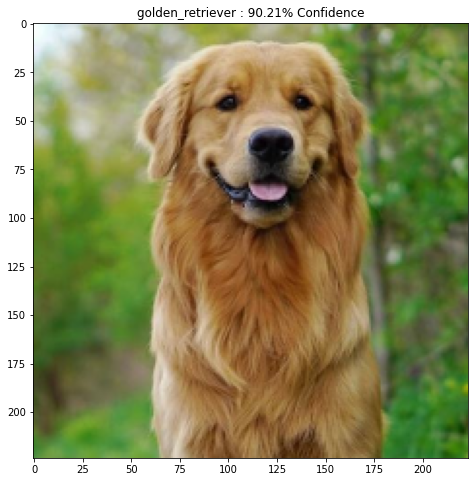

In [67]:
plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()

## Create the Adversarial Image. 

We use the FGSM method to create an adversarial image. Be sure to read about FGSM to understand how the attack works. 

In [68]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label, model):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = model(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad

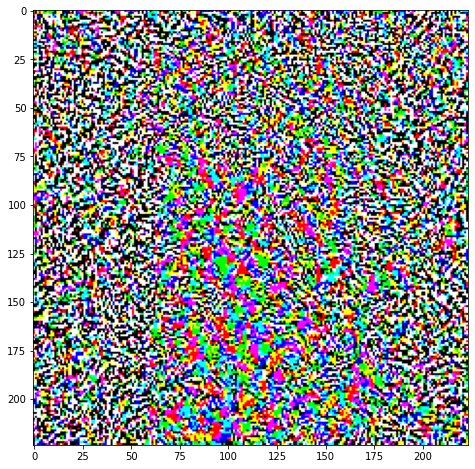

In [69]:
# Get the input label of the image.
retriever_index = 207
label = tf.one_hot(retriever_index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label, pretrained_model)
plt.imshow(perturbations[0] * 0.5 + 0.5);  # To change [-1, 1] to [0,1]

In [70]:
def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0]*0.5+0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()

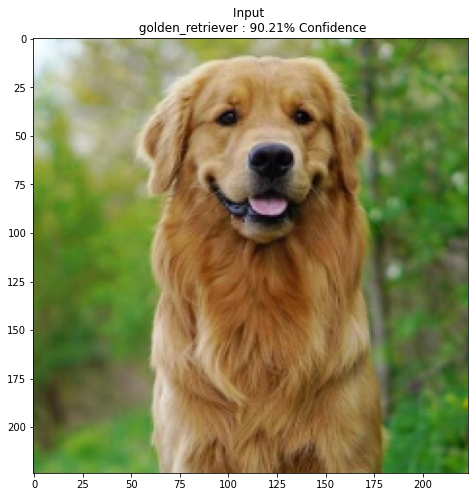

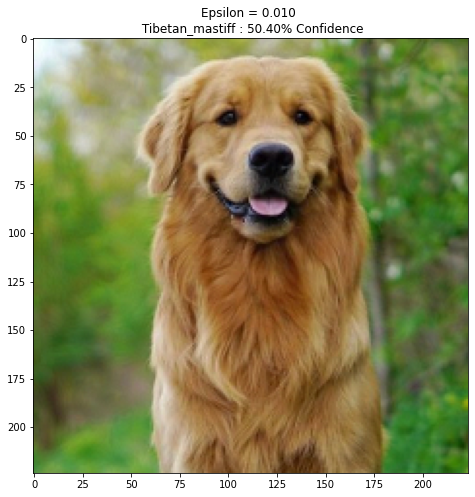

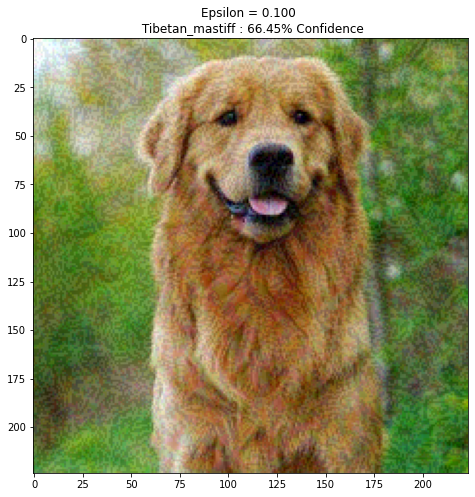

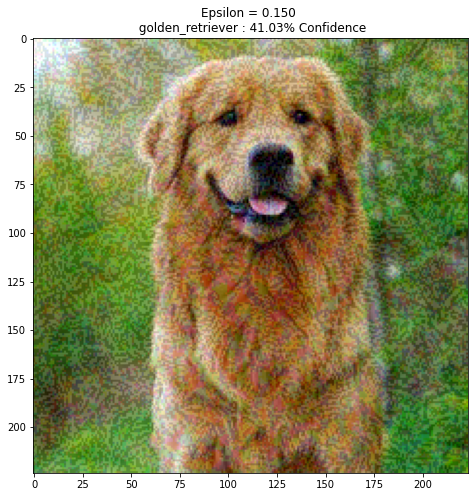

In [71]:
epsilons = [0, 0.01, 0.1, 0.15]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, descriptions[i])

# Task2: Perform an Analysis to understand the potency of the attack. 

Your task here is to understand how small a change could change the class output and this is measured by the epsilon value needed to change the class. 

Your task is as follows:

* Pick 10 images each from different classes in imagenet. 
* Perform a perturbation analysis on each of these images. 
* In the analysis you are required to report the smallest epsilon value for which you notice a class change. 
* Make a table for each of the images considered with the minimum epsilon value for the FGSM attack. 

Write the Code for the above below. You can add the table also below. 

### Images Considered

| Image | Label |
| ------| ----- |
| orange|  950  |
| golden_retriever | 207 | 
| giant_panda | 388 | 
| baboon | 372 |
| otter | 360 |
| bison | 347 | 
| cricket | 312 | 
| mongoose | 298 |
| Pomeranian | 259 |
| peacock | 84 |


In [72]:
imgs = ['baboon', 'otter', 'bison', 'cricket', 'golden-retrieve', 'orange', 'panda', 'mongoose', 'pom', 'peacock']
correct_classes = [372, 360, 347, 312, 207, 950, 388, 298, 259, 84]
img_paths = ['/content/' + s + '.jpg' for s in imgs]
print(img_paths)

['/content/baboon.jpg', '/content/otter.jpg', '/content/bison.jpg', '/content/cricket.jpg', '/content/golden-retrieve.jpg', '/content/orange.jpg', '/content/panda.jpg', '/content/mongoose.jpg', '/content/pom.jpg', '/content/peacock.jpg']


In [73]:
def display_imgs(image, model):
  image_probs = model.predict(image)
  plt.figure()
  image /= 255.0
  plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
  _, image_class, class_confidence = get_imagenet_label(image_probs)
  plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
  plt.show()

In [74]:
# Preprocess the images for MobileNet V2
images_mobileNet = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = tf.image.decode_image(image_raw)
  image = preprocess(image)
  images_mobileNet.append(image)

In [75]:
def test_epsilon (image, correct_class, model):
  step_eps = 0.001
  counter = 1

  label = tf.one_hot(correct_class, image_probs.shape[-1])
  label = tf.reshape(label, (1, image_probs.shape[-1]))

  if (tf.argmax(model.predict(image)[0]).numpy() != correct_class):
    display_imgs(image, model)
    print('Need to pick a new test image')
    return -1
  
  perturbations = create_adversarial_pattern(image, label, model)

  while True:
    adv_x = image + (step_eps*counter)*perturbations
    adv_x = tf.clip_by_value(adv_x, -1, 1)

    if (tf.argmax(model.predict(adv_x)[0]).numpy()== correct_class):
      counter += 1
    else:
      # display_imgs(adv_x, model)
      break
  
  return step_eps*counter


In [76]:
def task_2(images, correct_classes, model):
  eps = []

  for image, correct_class in zip(images, correct_classes):
    eps.append(test_epsilon(image, correct_class, model))

  return eps

In [77]:
eps = task_2(images_mobileNet, correct_classes, pretrained_model)

print(eps)

[0.002, 0.003, 0.003, 0.002, 0.004, 0.053, 0.012, 0.004, 0.012, 0.045]


# Task3: Compare the robustness of the considered model with other models. 

Your task here is to compare how this model (MobileNetV2) compares with other popular object detection models. 

Your task is as follows:

* Consider 5 different models (you can consider various RESNET architectures, any models you find interesting).
* Load the pre-trained weights of the model (trained on imagenet). 
* Perform Task2 on all the considered models. 
* Add all the results in the table. Hence the final table you have 6 columns for each model and epsilon values for each of the 10 images for all 6 models. 


What do you observe? Why do you think this is the case? 

Write the Code for the above below. You can also add the table and answer to the question below. 


In [78]:
def resize_image(img, size): 
  image = tf.image.decode_image(image_raw)
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (size, size))
  return image

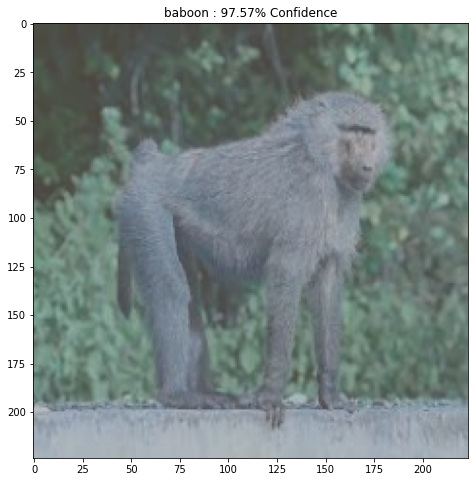

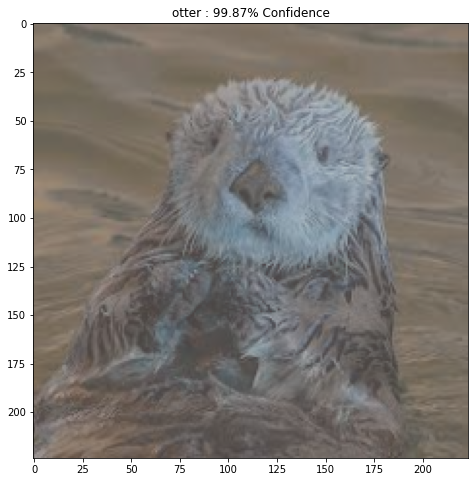

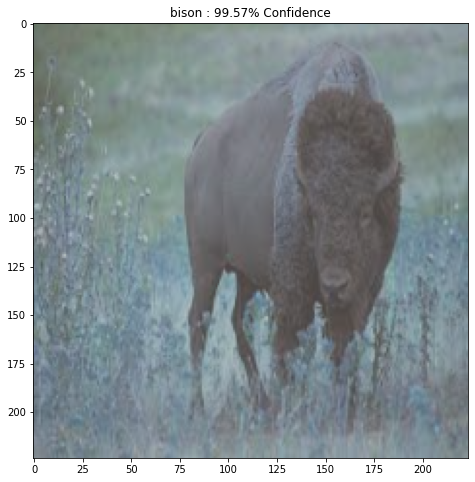

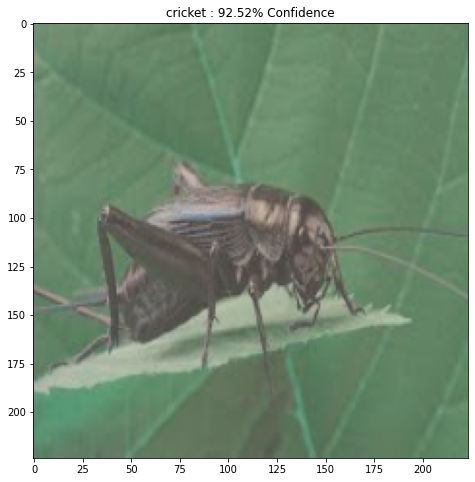

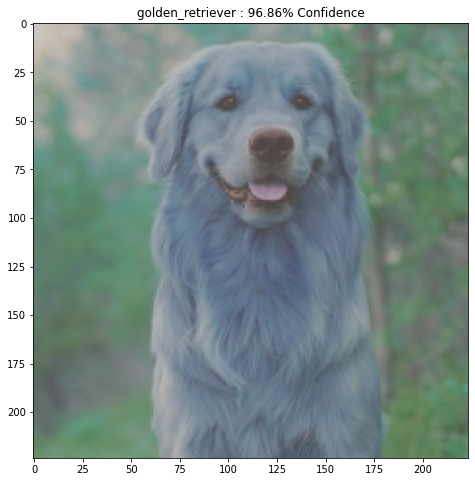

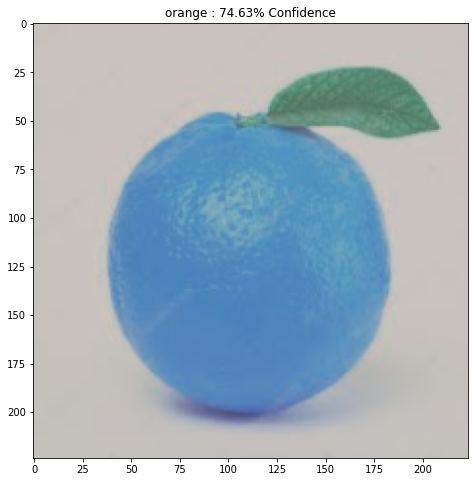

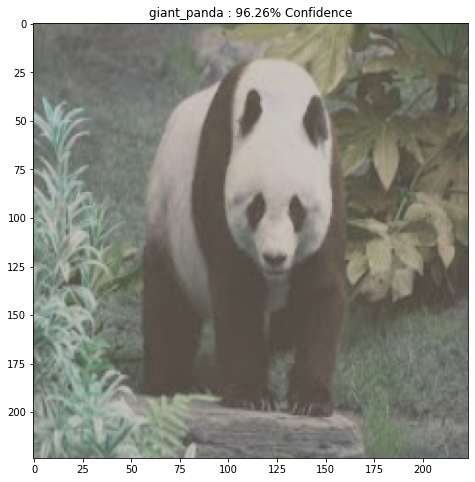

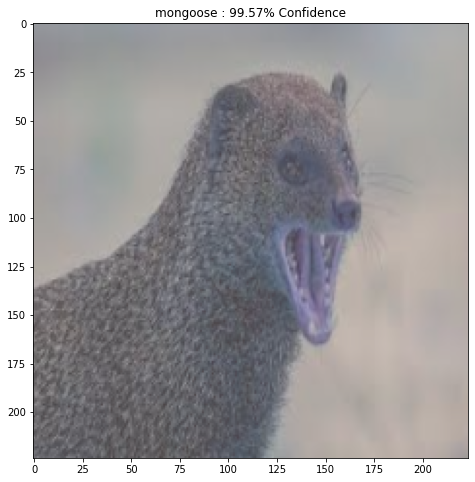

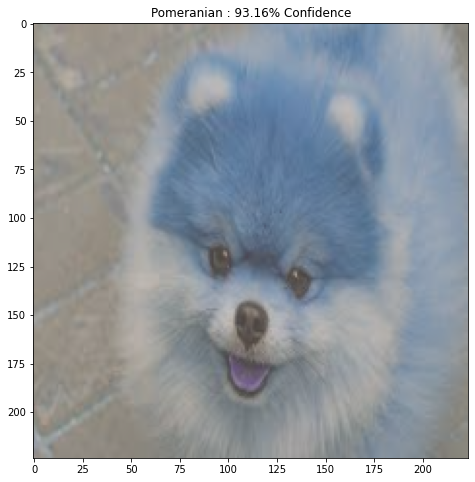

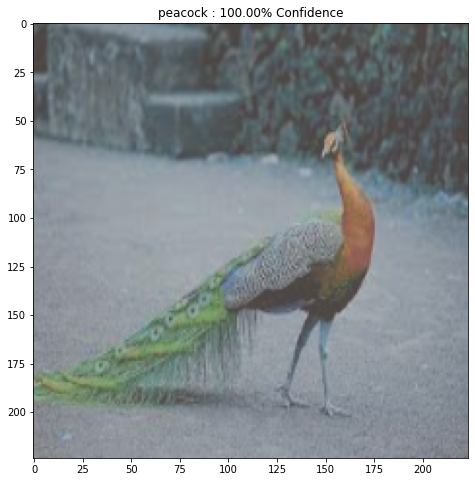

In [79]:
# Load the RESNET50 Model
resnet50_model = tf.keras.applications.resnet50.ResNet50(include_top=True, weights='imagenet')
resnet50_model.trainable = False

# Preprocess the images for MobileNet V2
images_resnet50 = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = resize_image(image_raw, 224)
  image = tf.keras.applications.resnet50.preprocess_input(image)
  image = image[None, ...]  
  images_resnet50.append(image)
  display_imgs(image, resnet50_model)

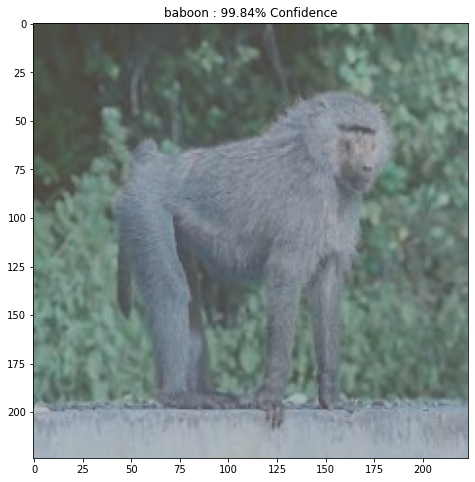

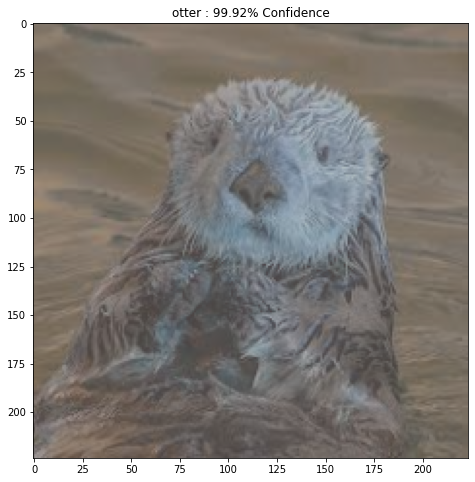

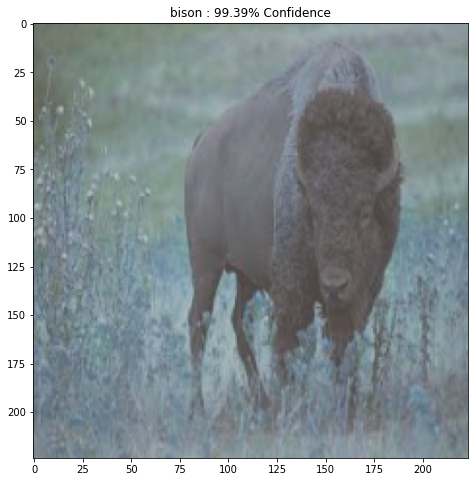

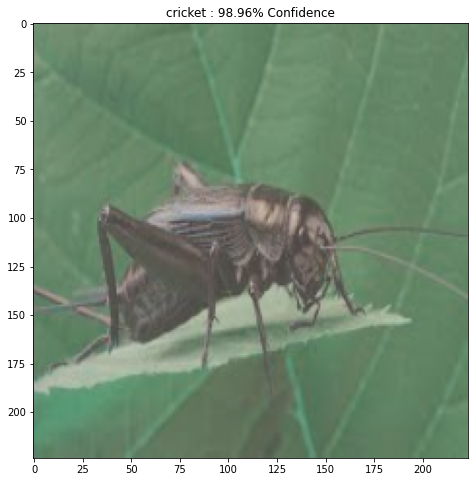

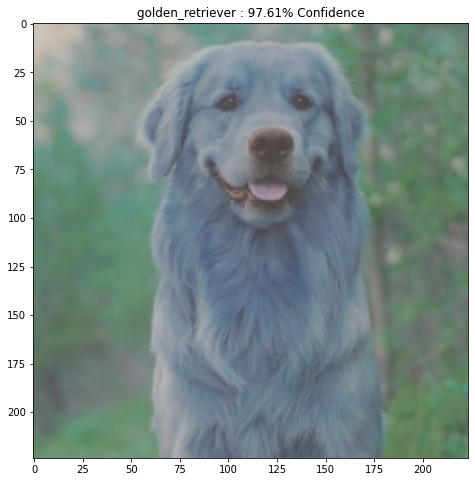

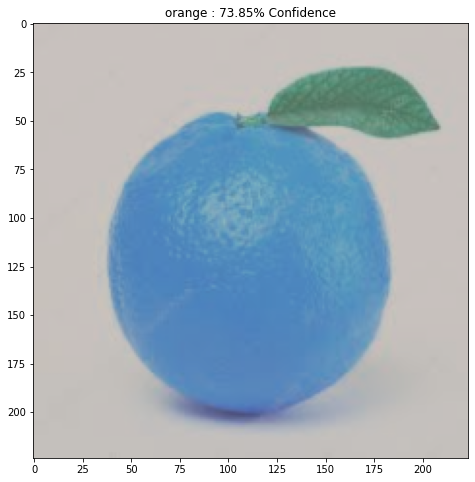

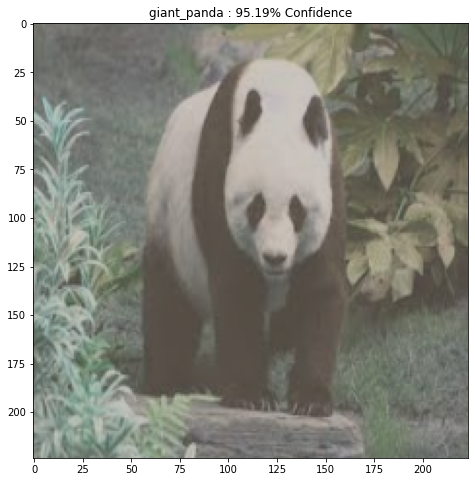

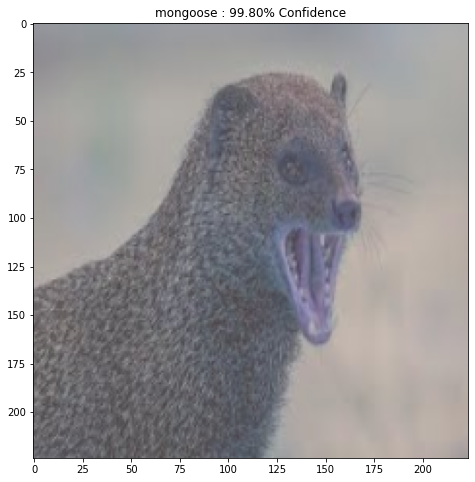

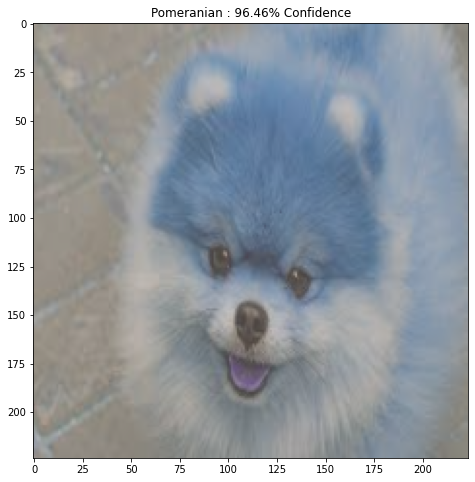

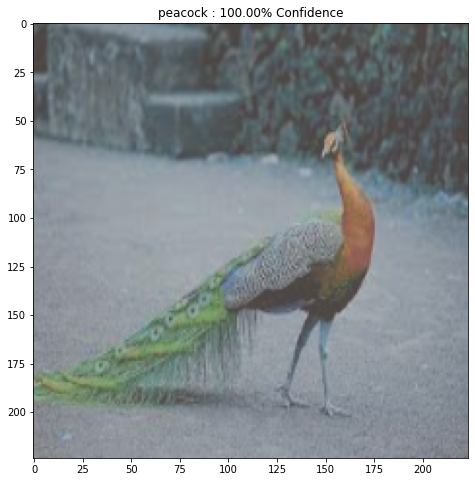

In [80]:
# Load the RESNET101 Model
resnet101_model = tf.keras.applications.resnet.ResNet101(include_top=True, weights='imagenet')
resnet101_model.trainable = False

# Preprocess the images for MobileNet V2
images_resnet101 = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = resize_image(image_raw, 224)
  image = tf.keras.applications.resnet50.preprocess_input(image)
  image = image[None, ...]  
  images_resnet101.append(image)
  display_imgs(image, resnet101_model)

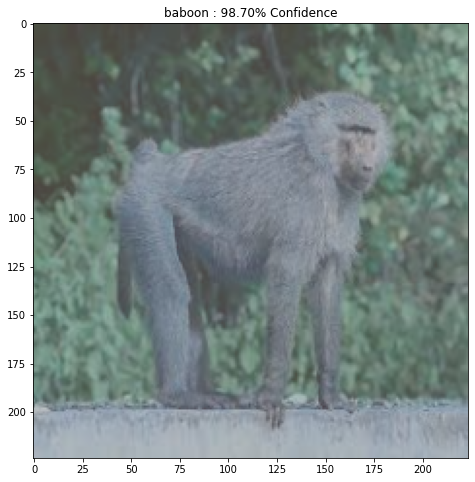

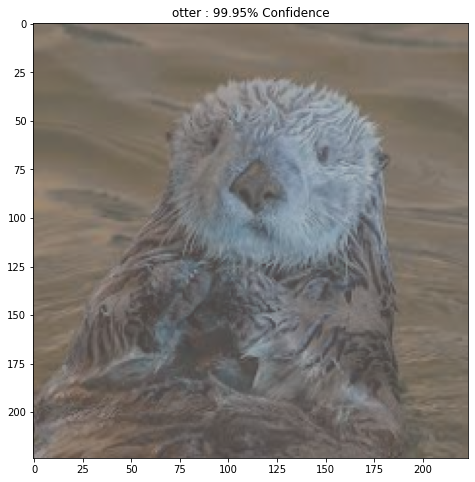

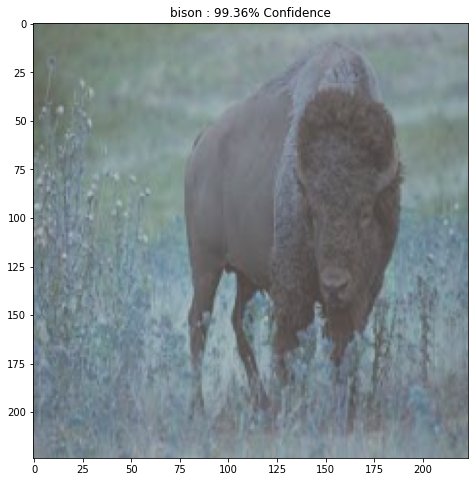

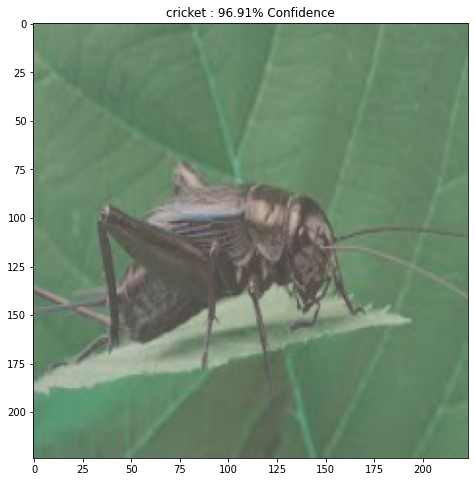

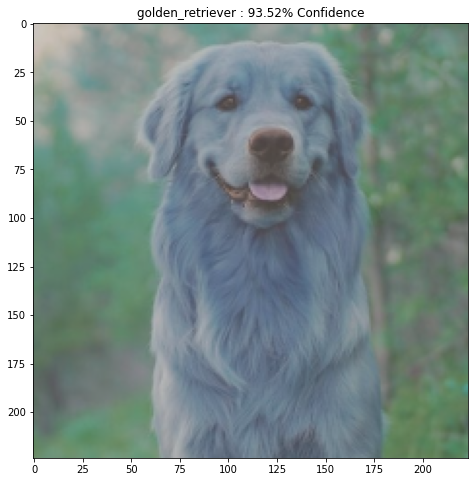

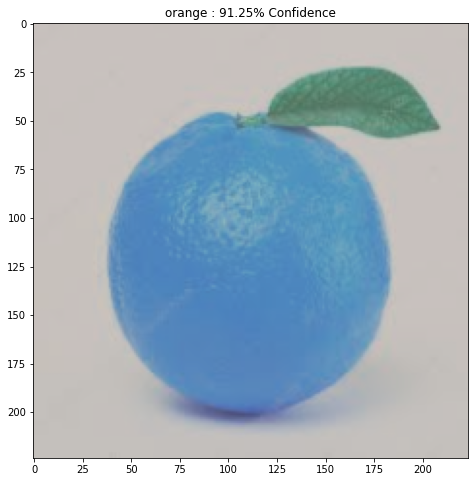

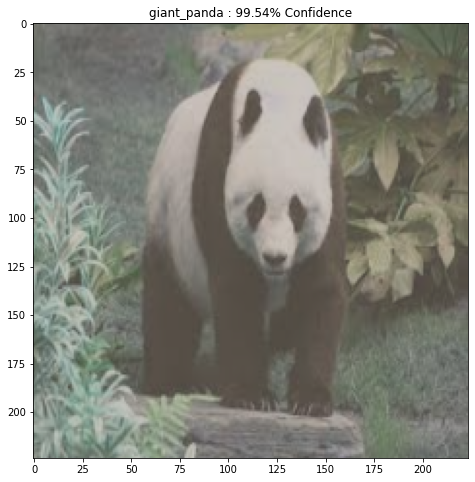

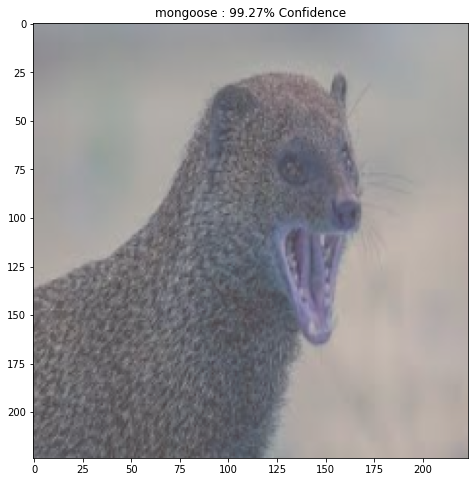

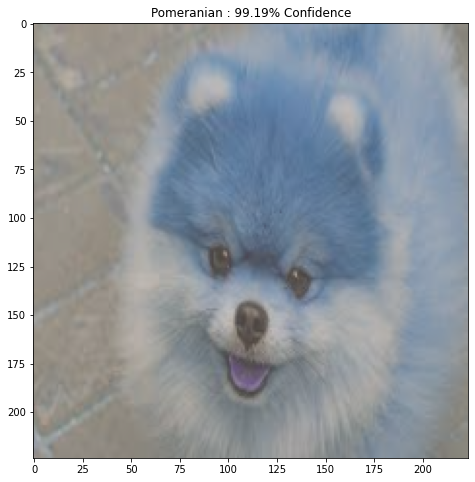

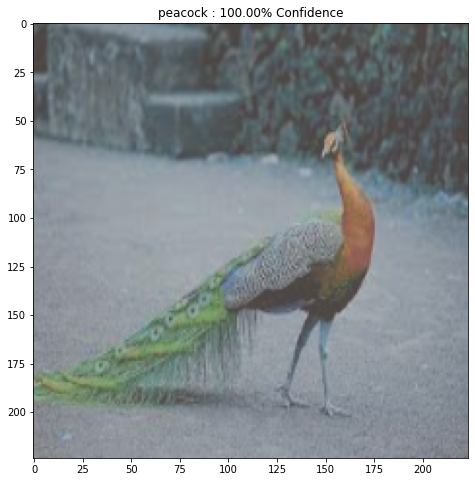

In [81]:
# Load the RESNET101 Model
resnet152_model = tf.keras.applications.resnet.ResNet152(include_top=True, weights='imagenet')
resnet152_model.trainable = False

# Preprocess the images for MobileNet V2
images_resnet152 = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = resize_image(image_raw, 224)
  image = tf.keras.applications.resnet50.preprocess_input(image)
  image = image[None, ...]  
  images_resnet152.append(image)
  display_imgs(image, resnet152_model)

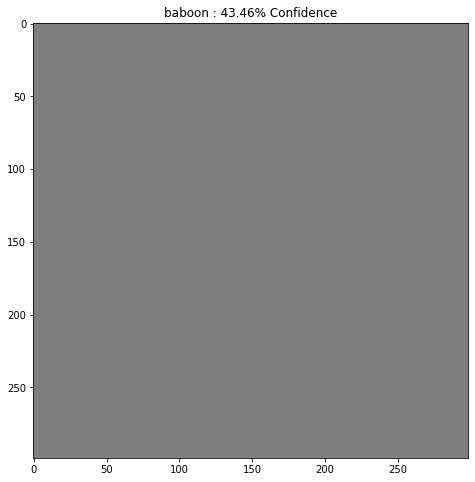

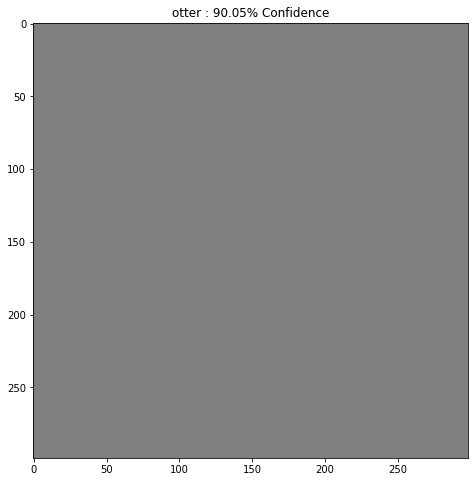

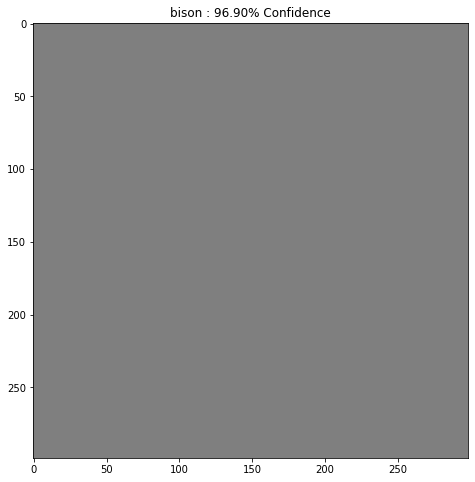

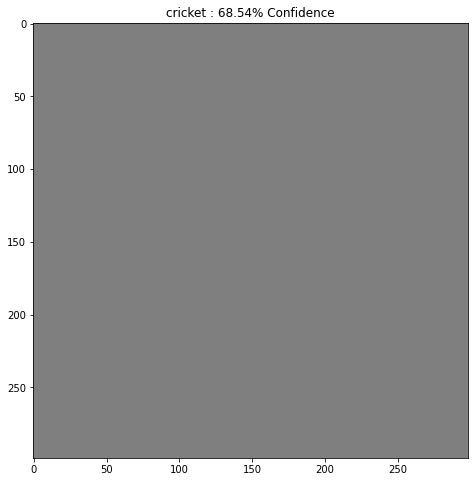

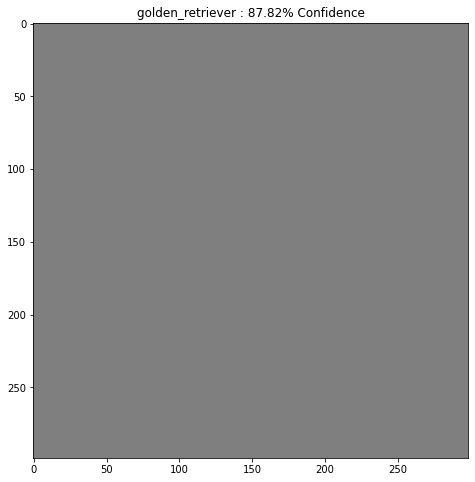

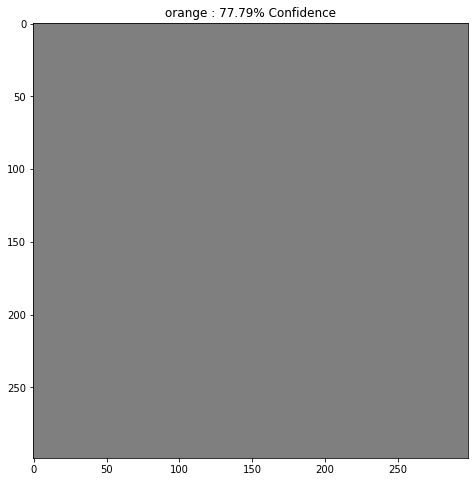

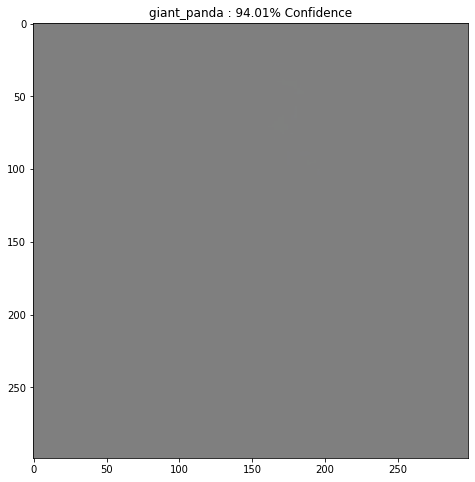

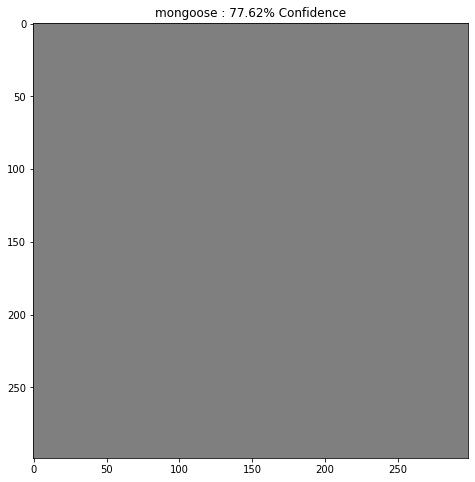

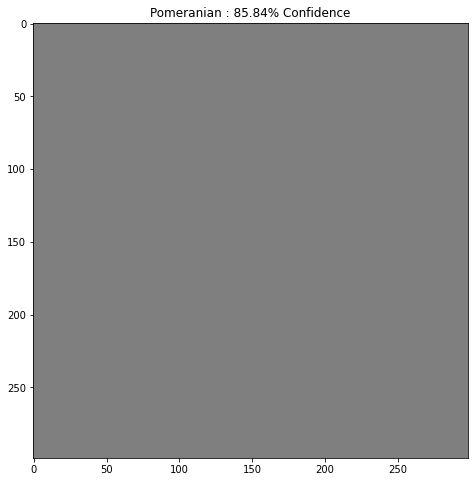

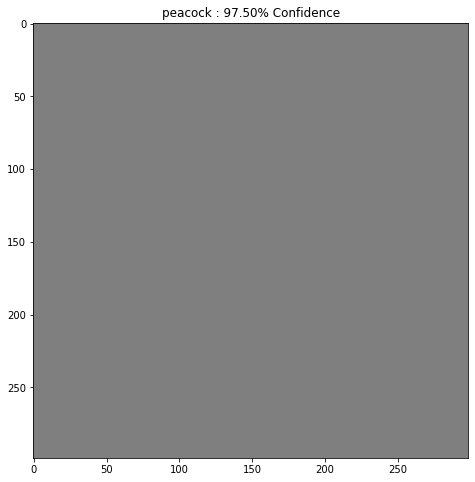

In [82]:
# Load the INCEPTION_V3 Model
inception_v3_model = tf.keras.applications.inception_v3.InceptionV3(include_top=True, weights='imagenet')
inception_v3_model.trainable = False

# Preprocess the images for MobileNet V2
images_inception_v3 = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = resize_image(image_raw, 299)
  image = tf.keras.applications.inception_v3.preprocess_input(image)
  image = image[None, ...]  
  images_inception_v3.append(image)
  display_imgs(image, inception_v3_model)

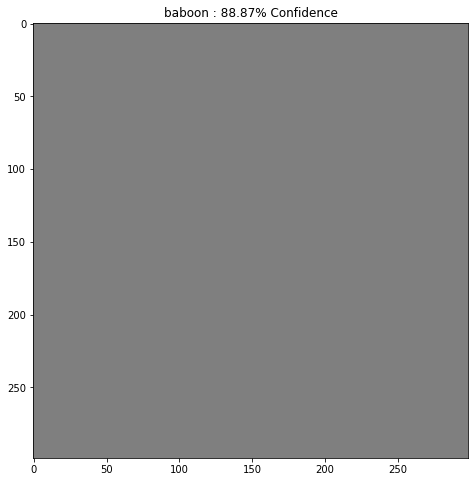

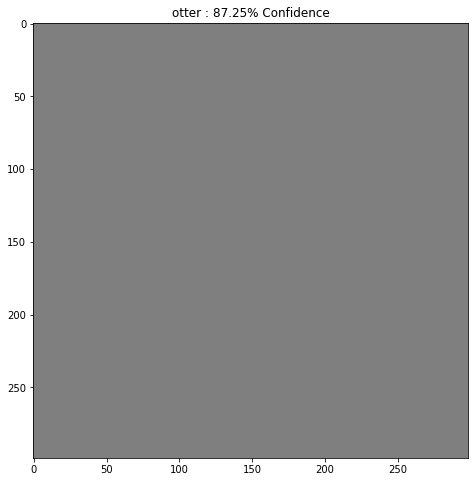

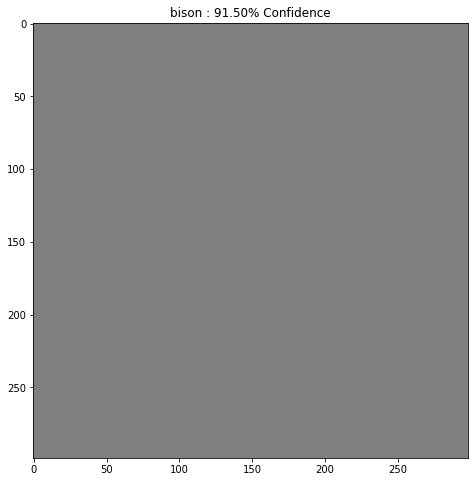

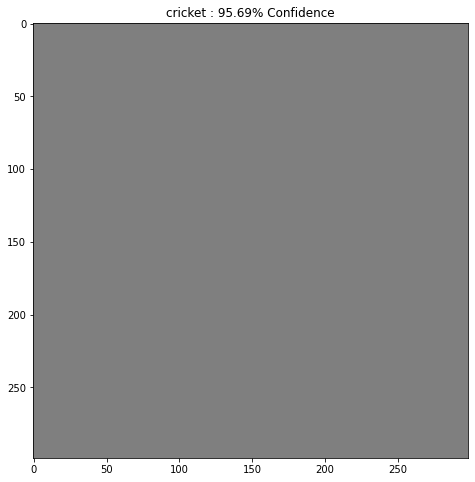

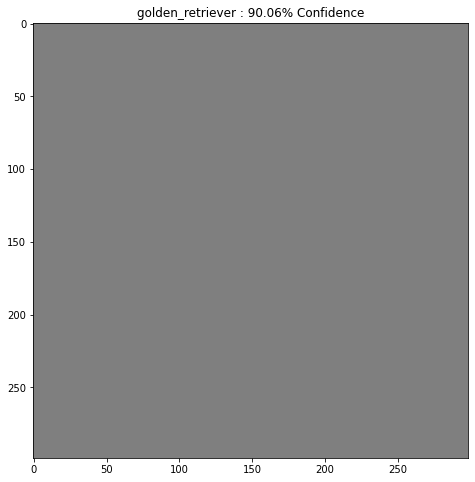

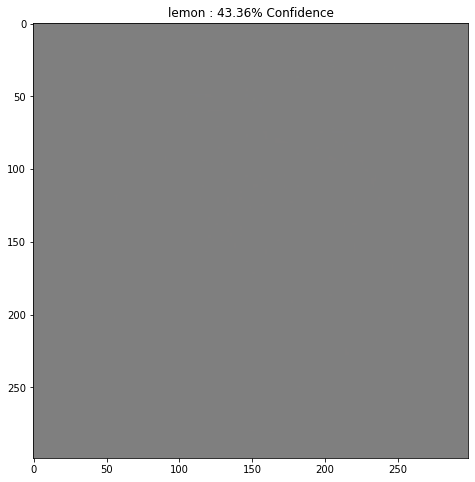

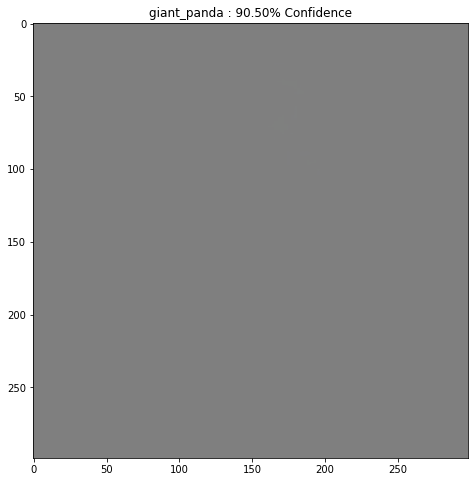

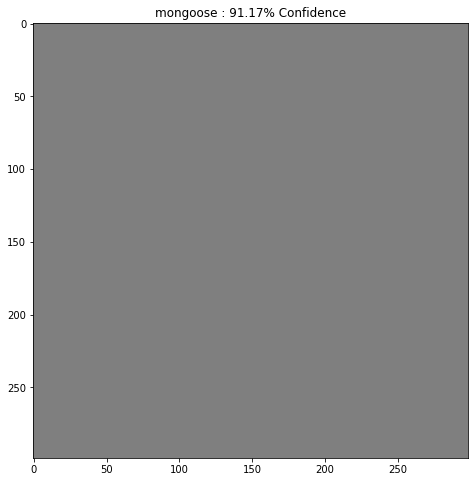

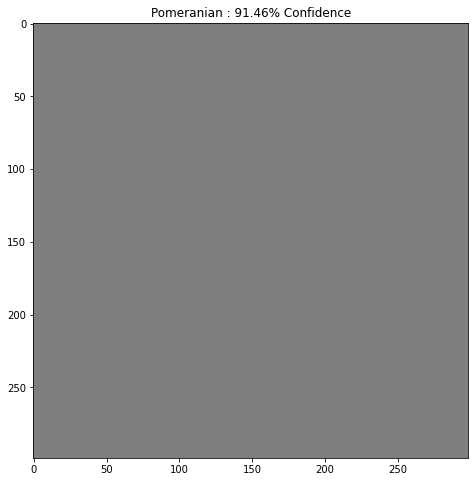

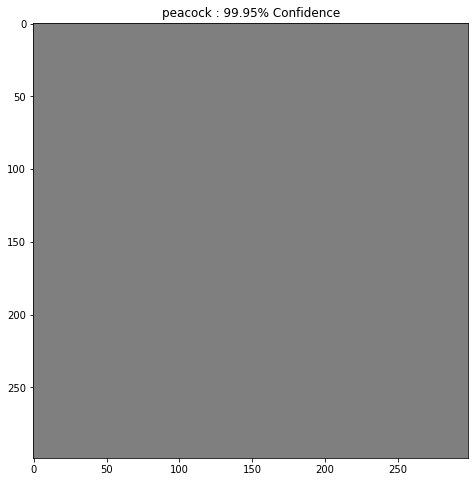

In [83]:
# Load the INCEPTION_V2 Model
inception_v2_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(include_top=True, weights='imagenet')
inception_v2_model.trainable = False

# Preprocess the images for MobileNet V2
images_inception_v2 = []

for img_path in img_paths:
  image_raw = tf.io.read_file(img_path)
  image = resize_image(image_raw, 299)
  image = tf.keras.applications.inception_resnet_v2.preprocess_input(image)
  image = image[None, ...]  
  images_inception_v2.append(image)
  display_imgs(image, inception_v2_model)

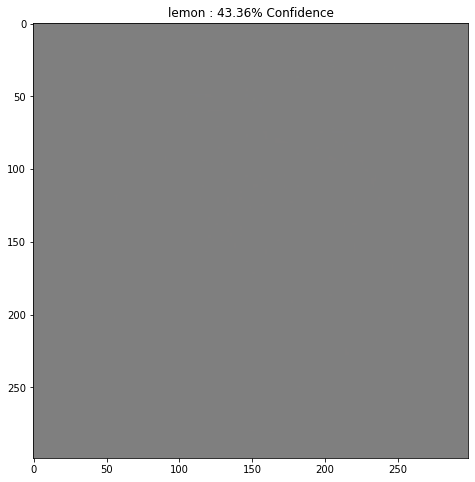

Need to pick a new test image
[[0.002, 0.003, 0.003, 0.002, 0.004, 0.053, 0.012, 0.004, 0.012, 0.045], [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001], [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001], [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001], [0.001, 0.003, 0.056, 0.001, 0.003, 0.001, 0.523, 0.186, 0.014, 0.259], [0.003, 0.227, 0.798, 0.02, 0.007, -1, 0.396, 0.212, 0.902, 0.024]]


In [84]:
# get the models
all_models = [resnet50_model, resnet101_model, resnet152_model, inception_v3_model, inception_v2_model]
all_images = [images_resnet50, images_resnet101, images_resnet152, images_inception_v3, images_inception_v2]
eps_all = [eps]
for img, model in zip(all_images, all_models):
  eps_all.append(task_2(img, correct_classes, model))

print(eps_all)


In [86]:
# 5 row table 10 column and epsilon values for each image-model pair
import pandas
data = eps_all
model_names = ['MobileNet V2', 'Resnet 50', 'Resnet 101', 'Resnet 152', 'Inception V3', 'Inception V2']
print(pandas.DataFrame(data, model_names, imgs))


              baboon  otter  bison  cricket  golden-retrieve  orange  panda  \
MobileNet V2   0.002  0.003  0.003    0.002            0.004   0.053  0.012   
Resnet 50      0.001  0.001  0.001    0.001            0.001   0.001  0.001   
Resnet 101     0.001  0.001  0.001    0.001            0.001   0.001  0.001   
Resnet 152     0.001  0.001  0.001    0.001            0.001   0.001  0.001   
Inception V3   0.001  0.003  0.056    0.001            0.003   0.001  0.523   
Inception V2   0.003  0.227  0.798    0.020            0.007  -1.000  0.396   

              mongoose    pom  peacock  
MobileNet V2     0.004  0.012    0.045  
Resnet 50        0.001  0.001    0.001  
Resnet 101       0.001  0.001    0.001  
Resnet 152       0.001  0.001    0.001  
Inception V3     0.186  0.014    0.259  
Inception V2     0.212  0.902    0.024  


### What do you observe? Why do you think this is the case? 

We can see that the Inception V2 and V3 models on average are less succeptable to our adversarial attacks. This is interesting because the other models are mostly linear. 

The Resnet Models are almost entirely linear and they do not perform well against the adversarial attack. The Resnet Architecture has a connection form 2 layers back. 

The MobileNet model has a special bottleneck layer that takes further previous output of a layer as an input. 

Finally, the Inception models use essentially sub-graphs of layers within the model. This makes it extremely non-linear. 

We can see that the Inception model is the most robust. This would make sense because it would be harder to compute the gradient of the model since the inception layers would essentially create their own local min/max in that input space. 

# BONUS: Can you provide a better attack?

Can you design a better attack that lowers the epsilon required for the images?

Task:

* Design another attack. 
* Compare the epsilon values on 10 images. 
* Does it perform better than the FGSM attack? That is, does it have lower epsilon values?

Write the code and provide your answers below. 

In [85]:
# no :)